In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import numpy as np
from matplotlib.lines import Line2D
from bokeh.plotting import figure, show, output_file
from bokeh.models import ColumnDataSource, Legend, LegendItem
from bokeh.layouts import column
from bokeh.io import output_notebook
from bokeh.models import HoverTool
from bokeh.palettes import Category20  
import itertools


In [23]:
galicia_wildfires = pd.read_csv(r"galicia_wildfires2013_2018.csv")
galicia_wildfires.head(5)

,date,idsubregion,burnt_area,latitude,longitude
0,15/01/2003 18:30,15,0.50,43.501195,-8.012159
1,16/01/2003 20:10,15,1.50,43.501195,-8.012159
2,17/01/2003 08:50,15,2.05,42.988479,-9.238336
3,28/01/2003 21:40,15,0.35,42.709977,-8.787082
4,13/02/2003 13:55,15,0.01,43.520902,-8.189201


In [24]:
galicia_wildfires['date'] = pd.to_datetime(galicia_wildfires['date'], format='%d/%m/%Y %H:%M')
galicia_wildfires['year'] = galicia_wildfires['date'].dt.year
galicia_wildfires['month'] = galicia_wildfires['date'].dt.month
galicia_wildfires['day'] = galicia_wildfires['date'].dt.day
galicia_wildfires['week_number'] = galicia_wildfires['date'].dt.isocalendar().week
galicia_wildfires['hour'] = galicia_wildfires['date'].dt.hour
galicia_wildfires.head(5)

,date,idsubregion,burnt_area,latitude,longitude,year,month,day,week_number,hour
0,2003-01-15 18:30:00,15,0.50,43.501195,-8.012159,2003,1,15,3,18
1,2003-01-16 20:10:00,15,1.50,43.501195,-8.012159,2003,1,16,3,20
2,2003-01-17 08:50:00,15,2.05,42.988479,-9.238336,2003,1,17,3,8
3,2003-01-28 21:40:00,15,0.35,42.709977,-8.787082,2003,1,28,5,21
4,2003-02-13 13:55:00,15,0.01,43.520902,-8.189201,2003,2,13,7,13


In [25]:
galicia_wildfires = galicia_wildfires.dropna(subset=['latitude', 'longitude'])

In [26]:
galicia_wildfires.describe(include=[np.number]).apply(lambda x: x.apply('{0:.2f}'.format))

,idsubregion,burnt_area,latitude,longitude,year,month,day,week_number,hour
count,72575.00,72575.00,72575.00,72575.00,72575.00,72575.00,72575.00,72575.00,72575.00
mean,28.29,5.08,42.54,-8.07,2007.73,6.53,15.65,26.60,14.98
std,8.00,60.10,0.53,0.71,4.00,2.65,8.35,11.47,6.14
min,15.00,0.00,4.67,-9.43,2003.00,1.00,1.00,1.00,0.00
25%,27.00,0.05,42.17,-8.57,2004.00,4.00,9.00,15.00,13.00
50%,32.00,0.23,42.44,-8.10,2006.00,7.00,16.00,30.00,16.00
75%,36.00,1.00,42.88,-7.60,2011.00,8.00,22.00,35.00,19.00
max,36.00,7352.14,78.64,47.51,2018.00,12.00,31.00,53.00,23.00


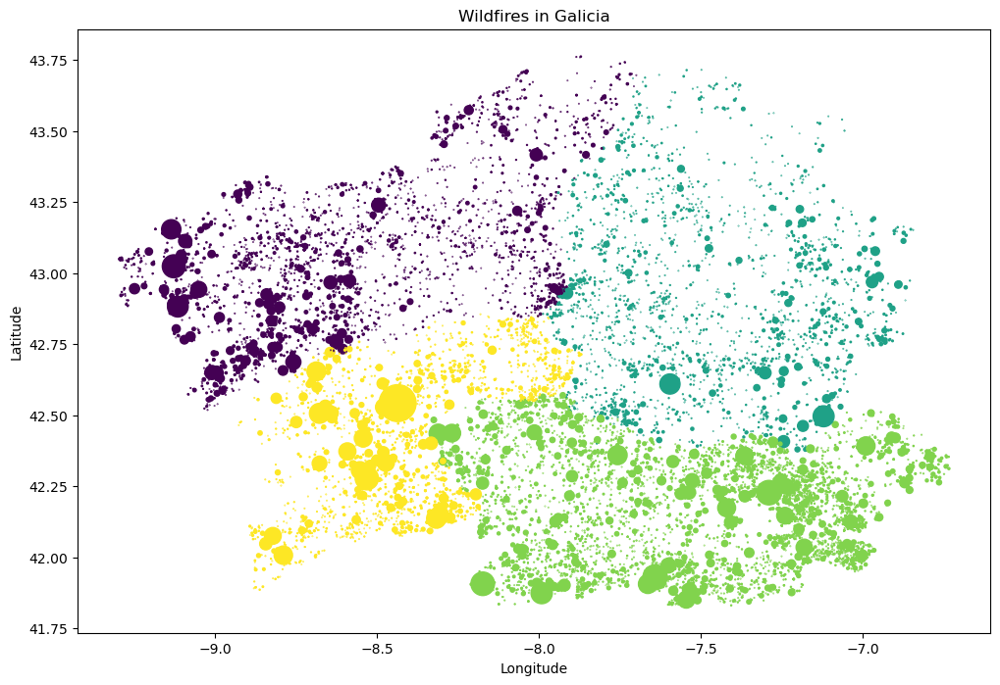

In [27]:
filtered = galicia_wildfires[(galicia_wildfires['longitude'] < -6.6) & (galicia_wildfires['latitude'] > 41) & (galicia_wildfires['latitude'] < 44) & (galicia_wildfires['burnt_area'] > 1)]

plt.figure(figsize=(12, 8))

# Extract the latitude and longitude coordinates
wildfire_coords = filtered[['latitude', 'longitude']]

# Plot latitude and longitude coordinates
plt.scatter(wildfire_coords['longitude'], wildfire_coords['latitude'], s=filtered['burnt_area']*0.1, c=filtered['idsubregion'], cmap='viridis' )
plt.title('Wildfires in Galicia')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.savefig('wildfires.png')
plt.show()

In [28]:
import folium
import pandas as pd

# Assuming 'galicia_wildfires' is already loaded as a DataFrame
filtered = galicia_wildfires[(galicia_wildfires['longitude'] < -6.6) &
                             (galicia_wildfires['latitude'] > 41) &
                             (galicia_wildfires['latitude'] < 44) &
                             (galicia_wildfires['burnt_area'] > 1)]

# Create a map centered around Galicia
map_galicia = folium.Map(location=[43.0, -8.0], zoom_start=8)

# Define color mapping based on 'idsubregion'
# Assuming 'idsubregion' ranges from a min to max integer values, adjust this to fit your actual data
subregion_min = filtered['idsubregion'].min()
subregion_max = filtered['idsubregion'].max()
colors = plt.cm.viridis(np.linspace(0, 1, subregion_max - subregion_min + 1))  # Using matplotlib's colormap

# Function to convert RGB colors to hex
def rgb_to_hex(rgb):
    return '#%02x%02x%02x' % (int(rgb[0] * 255), int(rgb[1] * 255), int(rgb[2] * 255))

# Add circles for wildfire incidents
for idx, row in filtered.iterrows():
    color_index = row['idsubregion'] - subregion_min  # Adjust index for colormap
    folium.Circle(
        location=[row['latitude'], row['longitude']],
        radius=row['burnt_area'] * 0.01,  # Adjust the multiplier for better visibility
        color=rgb_to_hex(colors[color_index]),
        fill=True,
        fill_color=rgb_to_hex(colors[color_index]),
        fill_opacity=0.5
    ).add_to(map_galicia)

# Save and display the map
map_galicia.save('Galicia_Wildfires.html')
map_galicia


all the wildfire incident happened in Galicia btw 2002-2018 divided by subregions by colours

In [29]:

import folium
import pandas as pd

# Assuming 'galicia_wildfires' is already loaded as a DataFrame
filtered = galicia_wildfires[(galicia_wildfires['longitude'] < -6.6) &
                             (galicia_wildfires['latitude'] > 41) &
                             (galicia_wildfires['latitude'] < 44) &
                             (galicia_wildfires['burnt_area'] > 100)]

# Create a map centered around Galicia
map_galicia = folium.Map(location=[43.0, -8.0], zoom_start=8)

# Define color mapping based on 'idsubregion'
# Assuming 'idsubregion' ranges from a min to max integer values, adjust this to fit your actual data
subregion_min = filtered['idsubregion'].min()
subregion_max = filtered['idsubregion'].max()
colors = plt.cm.viridis(np.linspace(0, 1, subregion_max - subregion_min + 1))  # Using matplotlib's colormap

# Function to convert RGB colors to hex
def rgb_to_hex(rgb):
    return '#%02x%02x%02x' % (int(rgb[0] * 255), int(rgb[1] * 255), int(rgb[2] * 255))

# Add circles for wildfire incidents
for idx, row in filtered.iterrows():
    color_index = row['idsubregion'] - subregion_min  # Adjust index for colormap
    # Apply a square root to the burnt_area to scale the radius
    scaled_radius = np.sqrt(row['burnt_area']) * 100  # Adjust the multiplier for desired size
    folium.Circle(
        location=[row['latitude'], row['longitude']],
        radius=scaled_radius,
        color=rgb_to_hex(colors[color_index]),
        fill=True,
        fill_color=rgb_to_hex(colors[color_index]),
        fill_opacity=0.5
    ).add_to(map_galicia)
# Save and display the map
map_galicia.save('Galicia_Wildfires.html')
map_galicia


I removed the small scaled wildfires and focused on the ones which burnt more than 100 hectares. Bigger the circle more area burnt.

In [30]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px


# Group data by month and count the number of incidents
monthly_counts = galicia_wildfires.groupby('month').size().reset_index(name='Counts')

# Ensure all months are represented, even those with zero incidents
all_months = pd.DataFrame({'month': range(1, 13)})
monthly_counts = pd.merge(all_months, monthly_counts, on='month', how='left').fillna(0)

# We start formatting and creating our radial polar plot here
fig = go.Figure()

fig.add_trace(go.Barpolar(
    r=monthly_counts['Counts'],
    # To convert month to degrees (12 months -> 360 degrees)
    theta=monthly_counts['month'] * 30 - 15,  # Center bars on months
    marker_color=[px.colors.sequential.Blues[i % len(px.colors.sequential.Blues)] for i in range(len(monthly_counts))],
    marker_line_color='black',
    marker_line_width=1,
    opacity=0.75
))

# Adding annotations for each bar to show the frequency count
for i, row in monthly_counts.iterrows():
    fig.add_annotation(
        # To convert month to degrees (12 months -> 360 degrees)
        x=row['month'] * 30 - 15,
        y=row['Counts'],
        # The frequency count
        text=str(int(row['Counts'])),  # Ensure the count is an integer
        font=dict(color='orange', size=12),
        showarrow=False,
        xanchor='center',
        yanchor='bottom'
    )

# Layout adjustments
fig.update_layout(
    title='Monthly Frequency of Historical Wildfire Incidents',
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, monthly_counts['Counts'].max() + 5]
        ),
        angularaxis=dict(
            tickmode='array',
            tickvals=list(range(0, 360, 30)),
            # Labeling months
            ticktext=[f"{m}" for m in ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']]
        )
    ),
    template="plotly_dark"  # style
)

fig.show()
fig.write_html('monthly_frequency.html')


horizontal 14k 16k values are the frequencies of wildfire incidents between 2002 and 2018

/var/folders/mj/z4m1vqb17qjgvm1h8rss_wlh0000gn/T/ipykernel_69974/3205407989.py:30: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

<Figure size 1600x1000 with 0 Axes>

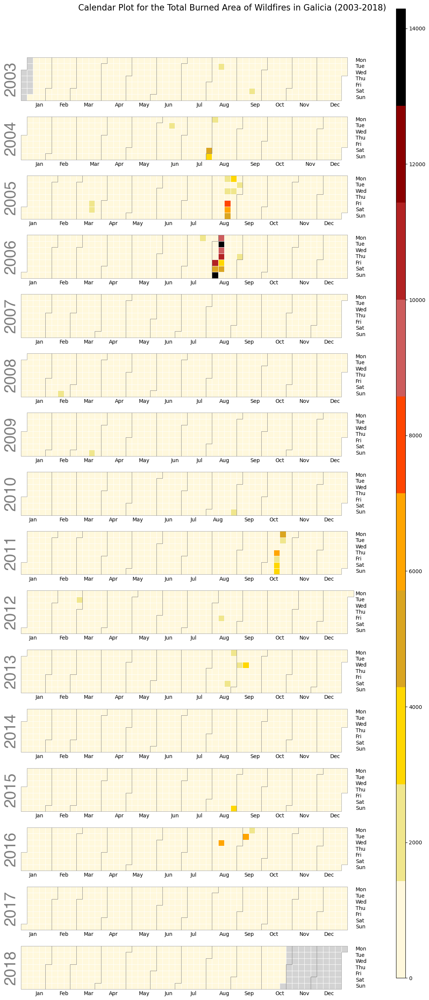

In [31]:
import pandas as pd
import calplot
from matplotlib.colors import ListedColormap

# Assuming 'galicia_wildfires' is already loaded as a DataFrame
# Ensure the 'date' column is the correct datetime type
galicia_wildfires['date'] = pd.to_datetime(galicia_wildfires['date'])

# Group by date and sum the burnt areas
burnt_area_daily = galicia_wildfires.groupby('date')['burnt_area'].sum()

# Define burnt area thresholds and corresponding colors
#burnt_area_thresholds = [0, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
burnt_area_thresholds = [0, 1, 10, 50, 100, 500, 1000, 2500, 5000, 10000,]
#burnt_area_thresholds = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90,]
colors = ['cornsilk', 'khaki', 'gold','goldenrod', 'orange', 'orangered','indianred','firebrick','darkred','black' ]
#colors = ['cornsilk','palegoldenrod', 'khaki', 'gold', 'orange', 'darkorange', ]

# Create a custom discrete colormap
cmap = ListedColormap(colors)

# Using calplot to plot our calendar plot
plt.figure(figsize=(16, 10))
calplot.calplot(burnt_area_daily, cmap=cmap, fillcolor='lightgrey', linecolor='white', linewidth=0.5)

# Title of our plot
plt.suptitle('Calendar Plot for the Total Burned Area of Wildfires in Galicia (2003-2018)', fontsize=16)

# Adjust layout and position the colorbar on the right
plt.tight_layout(rect=[0, 0, 0.8, 0.95])  # Adjust right side space for colorbar

# Create a norm object based on burnt area thresholds
norm = plt.Normalize(min(burnt_area_daily), max(burnt_area_daily))

# Create a ScalarMappable object for the colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Burnt Area (Ha)', orientation='vertical', pad=0.02, fraction=0.1)  # Add colorbar on the right

plt.show()


burnt area in hectares calendar plot

C:\Users\45502\AppData\Local\Temp\ipykernel_23860\2983039805.py:35: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



<Figure size 1152x720 with 0 Axes>

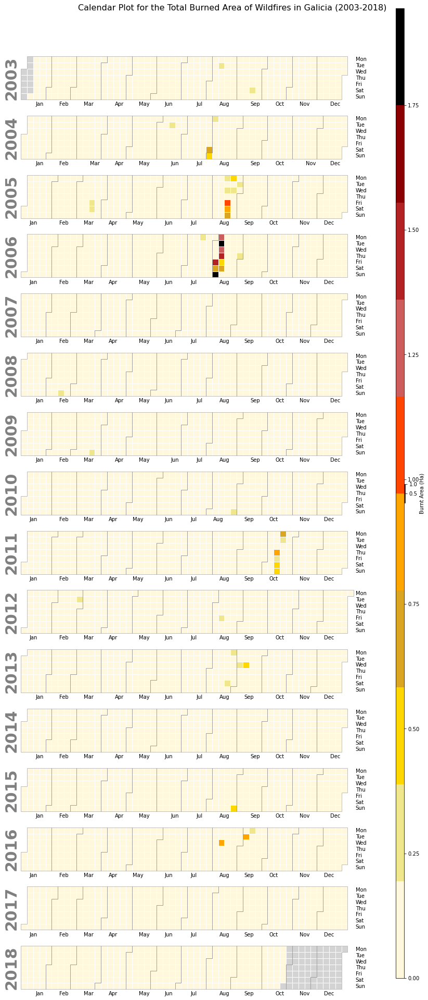

In [ ]:
import pandas as pd
import calplot
from matplotlib.colors import ListedColormap

# Assuming 'galicia_wildfires' is already loaded as a DataFrame
# Ensure the 'date' column is the correct datetime type
galicia_wildfires['date'] = pd.to_datetime(galicia_wildfires['date'])

# Group by date and sum the burnt areas
burnt_area_daily = galicia_wildfires.groupby('date')['burnt_area'].sum()

# Normalize the burnt_area_daily data
max_burnt_area = burnt_area_daily.max()
normalized_burnt_area_daily = burnt_area_daily / max_burnt_area if max_burnt_area else burnt_area_daily


# Define burnt area thresholds and corresponding colors
#burnt_area_thresholds = [0, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
burnt_area_thresholds = [0, 1, 10, 50, 100, 500, 1000, 2500, 5000, 10000,]
#burnt_area_thresholds = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90,]
colors = ['cornsilk', 'khaki', 'gold','goldenrod', 'orange', 'orangered','indianred','firebrick','darkred','black' ]
#colors = ['cornsilk','palegoldenrod', 'khaki', 'gold', 'orange', 'darkorange', ]

# Create a custom discrete colormap
cmap = ListedColormap(colors)

# Using calplot to plot our calendar plot
plt.figure(figsize=(16, 10))
calplot.calplot(normalized_burnt_area_daily, cmap=cmap, fillcolor='lightgrey', linecolor='white', linewidth=0.5)

# Title of our plot
plt.suptitle('Calendar Plot for the Total Burned Area of Wildfires in Galicia (2003-2018)', fontsize=16)

# Adjust layout and position the colorbar on the right
plt.tight_layout(rect=[0, 0, 0.8, 0.95])  # Adjust right side space for colorbar

# Create a norm object based on burnt area thresholds
norm = plt.Normalize(min(normalized_burnt_area_daily), max(normalized_burnt_area_daily))

# Create a ScalarMappable object for the colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Burnt Area (Ha)', orientation='vertical', pad=0.02, fraction=0.1)  # Add colorbar on the right

plt.show()


neglect it

In [ ]:
galicia_weather = pd.read_csv(r"C:\Users\45502\Desktop\galicia\Hourly Weather data for Galicia Jan2003-March2024.csv")
galicia_weather.head(5)

,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),precipitation (mm),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),et0_fao_evapotranspiration (mm),vapour_pressure_deficit (kPa),...,soil_moisture_7_to_28cm (m³/m³),soil_moisture_28_to_100cm (m³/m³),soil_moisture_100_to_255cm (m³/m³),is_day (),sunshine_duration (s),shortwave_radiation_instant (W/m²),direct_radiation_instant (W/m²),diffuse_radiation_instant (W/m²),direct_normal_irradiance_instant (W/m²),terrestrial_radiation_instant (W/m²)
0,2003-01-01T00:00,11.4,89,9.6,1.1,1019.0,1000.5,100,0.01,0.15,...,0.485,0.488,0.5,0,0.0,0.0,0.0,0.0,0.0,0.0
1,2003-01-01T01:00,11.5,89,9.8,1.4,1018.3,999.8,100,0.01,0.15,...,0.486,0.487,0.5,0,0.0,0.0,0.0,0.0,0.0,0.0
2,2003-01-01T02:00,11.6,89,9.9,1.4,1017.5,999.0,100,0.01,0.15,...,0.486,0.487,0.5,0,0.0,0.0,0.0,0.0,0.0,0.0
3,2003-01-01T03:00,11.7,89,10.0,1.5,1017.1,998.6,100,0.01,0.15,...,0.491,0.487,0.5,0,0.0,0.0,0.0,0.0,0.0,0.0
4,2003-01-01T04:00,11.6,92,10.3,1.9,1016.9,998.4,100,0.00,0.11,...,0.486,0.490,0.5,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
galicia_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186264 entries, 0 to 186263
Data columns (total 23 columns):
 #   Column                                   Non-Null Count   Dtype  
---  ------                                   --------------   -----  
 0   time                                     186264 non-null  object 
 1   temperature_2m (°C)                      186264 non-null  float64
 2   relative_humidity_2m (%)                 186264 non-null  int64  
 3   dew_point_2m (°C)                        186264 non-null  float64
 4   precipitation (mm)                       186264 non-null  float64
 5   pressure_msl (hPa)                       186264 non-null  float64
 6   surface_pressure (hPa)                   186264 non-null  float64
 7   cloud_cover (%)                          186264 non-null  int64  
 8   et0_fao_evapotranspiration (mm)          186264 non-null  float64
 9   vapour_pressure_deficit (kPa)            186264 non-null  float64
 10  wind_speed_10m (km/h)           

In [ ]:
import pandas as pd
from bokeh.plotting import figure, show, output_file
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.io import output_notebook
from bokeh.layouts import column
from bokeh.palettes import Category20  
import itertools

In [ ]:
# Assuming galicia_weather is already loaded as a DataFrame and date parsing is needed
galicia_weather['time'] = pd.to_datetime(galicia_weather['time'])

In [ ]:
output_notebook()

Loading BokehJS ...

In [32]:
# Select attributes you want to plot
attributes = ['temperature_2m (°C)','relative_humidity_2m (%)','soil_moisture_0_to_7cm (m³/m³)',
              'precipitation (mm)', 'wind_speed_10m (km/h)']

# Create a figure
p = figure(title="Galicia Weather Data Over Time", x_axis_label='Date and Time', y_axis_label='Value', 
           x_axis_type="datetime", sizing_mode="stretch_width", height=400)

colors = itertools.cycle(Category20[20])  # Color cycle for multiple lines

# Add lines to the plot
for attribute, color in zip(attributes, colors):
    p.line(galicia_weather['time'], galicia_weather[attribute], legend_label=attribute, line_width=2, color=color)

# Adjust legend settings
p.legend.location = "top_left"
p.legend.click_policy = "hide"  # Click on legend entries to hide/show lines
p.legend.label_text_font_size = "8pt"
p.legend.orientation = "vertical"

# Add hover tool
p.add_tools(HoverTool(
    tooltips=[
        ("Date", "@x{%F}"),
        ("Time", "@x{%H:%M}"),
        ("Value", "@y{0.0}")  # Adjust tooltip formatting
    ],
    formatters={"@x": "datetime"},
    mode='vline'
))

show(p)

NameError: name 'galicia_weather' is not defined

Historical time series weather data 

In [ ]:
galicia_releasedgastotal = pd.read_csv(r"C:\Users\45502\Desktop\galicia\monthly total gas released from burned are spain_galicia_2002_2023.csv")
galicia_releasedgastotal.head(5)

,year,month,region,CO2,CO,TPM,PM25,TPC,NMHC,OC,CH4,SO2,BC,NOx
0,2002,1,Galicia,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,2002,2,Galicia,22535.052,1202.291,228.750,165.325,125.476,112.970,118.445,47.629,13.854,7.024,29.088
2,2002,3,Galicia,34622.885,1515.237,238.283,183.307,106.545,110.338,97.419,54.264,13.718,8.995,67.585
3,2002,4,Galicia,80636.228,3897.548,672.776,498.031,335.511,326.068,312.258,148.580,39.561,23.075,133.829
4,2002,5,Galicia,1879.408,70.227,9.475,7.992,3.344,3.790,2.921,2.163,0.535,0.412,4.347


In [ ]:
galicia_releasedgastotal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264 entries, 0 to 263
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   year    264 non-null    int64  
 1   month   264 non-null    int64  
 2   region  264 non-null    object 
 3   CO2     264 non-null    float64
 4   CO      264 non-null    float64
 5   TPM     264 non-null    float64
 6   PM25    264 non-null    float64
 7   TPC     264 non-null    float64
 8   NMHC    264 non-null    float64
 9   OC      264 non-null    float64
 10  CH4     264 non-null    float64
 11  SO2     264 non-null    float64
 12  BC      264 non-null    float64
 13  NOx     264 non-null    float64
dtypes: float64(11), int64(2), object(1)
memory usage: 29.0+ KB


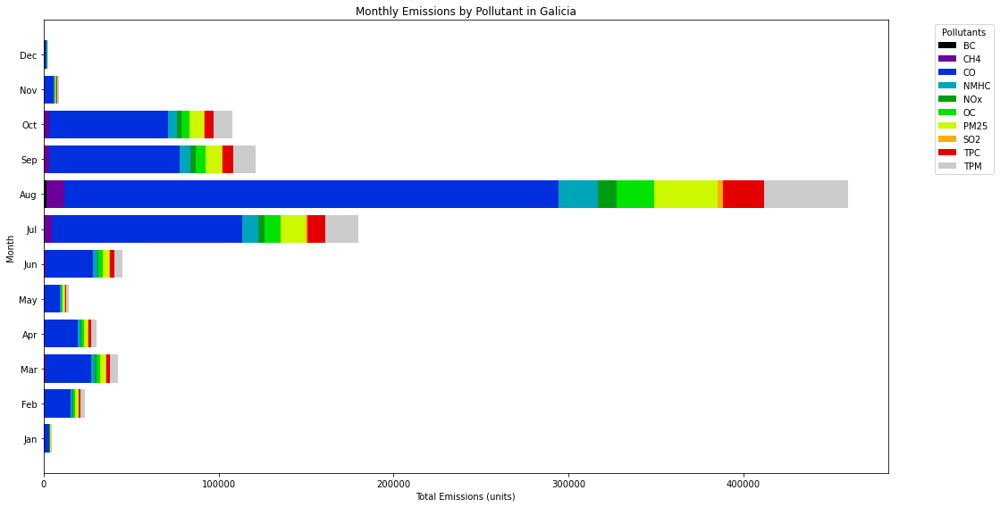

In [ ]:
from matplotlib import cm
# Pivot the data
pivoted_data = pd.pivot_table(grouped_data, index='month', values=['CO2', 'CO', 'TPM', 'PM25', 'TPC', 'NMHC', 'OC', 'CH4', 'SO2', 'BC', 'NOx'], aggfunc='sum')

# Plot setup
fig, ax = plt.subplots(figsize=(14, 8))

# Colors for the bars using a rainbow colormap
colors = cm.nipy_spectral(np.linspace(0, 1, len(pivoted_data.columns)))

# Create horizontal bars for each pollutant
for i, column in enumerate(pivoted_data.columns):
    ax.barh(pivoted_data.index, pivoted_data[column], color=colors[i], left=pivoted_data[pivoted_data.columns[:i]].sum(axis=1), label=column)

# Adding labels and title
ax.set_xlabel('Total Emissions (units)')
ax.set_ylabel('Month')
ax.set_title('Monthly Emissions by Pollutant in Galicia')
ax.set_yticks(range(1, 13))
ax.set_yticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Layout adjustments
plt.tight_layout()

# Adding a legend with a title and moving it to the right of the plot
ax.legend(title='Pollutants', bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.show()

pollutants realased because of wildfires by month